In [93]:
import os

import numpy as np

from scipy import ndimage

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as img

import astropy.time
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.visualization import ImageNormalize, SqrtStretch

from photutils.centroids import centroid_com as cen

from sunpy.net.helioviewer import HelioviewerClient
import sunpy.map
from sunpy.map import Map
from sunpy.map import MapSequence
from sunpy.net import Fido
from sunpy.net import attrs as a
from sunpy.net import helioviewer
from sunpy.visualization.animator import MapSequenceAnimator

import sunkit_image.coalignment as coal

import imageio

In [2]:
hv = helioviewer.HelioviewerClient()  
for sourceid, obs in hv.data_sources.items():
    print(f"{sourceid}: {obs}")

('SOHO', 'EIT', None, '171'): 0
('SOHO', 'EIT', None, '195'): 1
('SOHO', 'EIT', None, '284'): 2
('SOHO', 'EIT', None, '304'): 3
('SOHO', 'LASCO', 'C2', 'white-light'): 4
('SOHO', 'LASCO', 'C3', 'white-light'): 5
('SOHO', 'MDI', None, 'magnetogram'): 6
('SOHO', 'MDI', None, 'continuum'): 7
('SDO', 'AIA', None, '94'): 8
('SDO', 'AIA', None, '131'): 9
('SDO', 'AIA', None, '171'): 10
('SDO', 'AIA', None, '193'): 11
('SDO', 'AIA', None, '211'): 12
('SDO', 'AIA', None, '304'): 13
('SDO', 'AIA', None, '335'): 14
('SDO', 'AIA', None, '1600'): 15
('SDO', 'AIA', None, '1700'): 16
('SDO', 'AIA', None, '4500'): 17
('SDO', 'HMI', None, 'continuum'): 18
('SDO', 'HMI', None, 'magnetogram'): 19
('STEREO_A', 'SECCHI', 'EUVI', '171'): 20
('STEREO_A', 'SECCHI', 'EUVI', '195'): 21
('STEREO_A', 'SECCHI', 'EUVI', '284'): 22
('STEREO_A', 'SECCHI', 'EUVI', '304'): 23
('STEREO_B', 'SECCHI', 'EUVI', '171'): 24
('STEREO_B', 'SECCHI', 'EUVI', '195'): 25
('STEREO_B', 'SECCHI', 'EUVI', '284'): 26
('STEREO_B', 'SECC

In [3]:
hv = HelioviewerClient()  
file = hv.download_jp2('2012/01/01', observatory="SDO", instrument="AIA", measurement="4500")  

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.8899 2047. ] pix

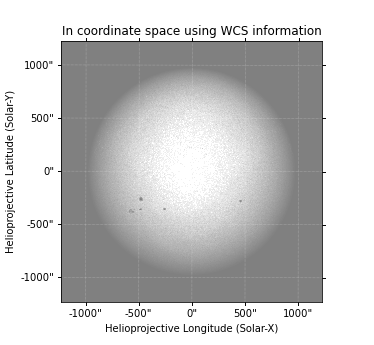
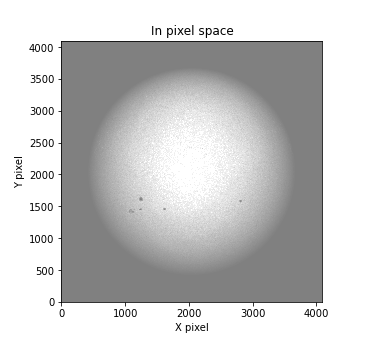
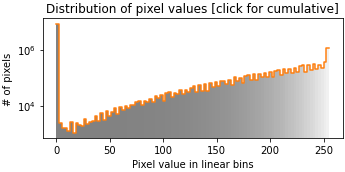
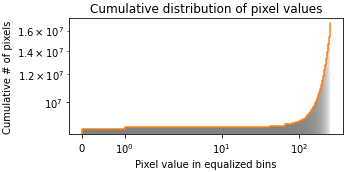

In [58]:
aia = Map(file)  
aia

In [5]:
# aia_map = sunpy.map.Map(file)
# aia_map.plot()
# aia_map.draw_limb()

# # let's add contours as well
# aia_map.draw_contours([10,20,30,40,50,60,70,80,90] * u.percent)

# plt.colorbar()
# plt.show()

In [6]:
file

'/Users/waritwij/sunpy/data/2012_01_01__00_00_08_40__SDO_AIA_AIA_4500.jp2'

In [117]:
a = aia.data
print(a)

[[  0   2   0 ...   0   0   0]
 [252   0   2 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


In [84]:
com = ndimage.measurements.center_of_mass(a)
com

(2074.2758760443776, 2048.938685857621)

In [85]:
com2 = cen(a)
com2

array([2048.93868586, 2074.27587604])

In [86]:
refpix = aia.reference_pixel
refpix

PixelPair(x=<Quantity 2050.8899 pix>, y=<Quantity 2047. pix>)

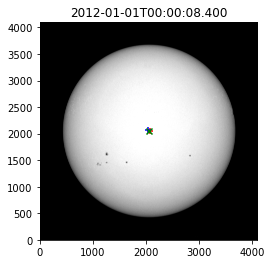

In [87]:
plt.imshow(a, origin = 'lower', cmap = 'gray', vmin = 0, vmax = 255)
plt.scatter(com[0], com[1], color = 'r', marker = '+')
plt.scatter(com2[0], com2[1], color = 'b', marker = '+')
plt.scatter(refpix[0], refpix[1], color = 'g', marker = 'x')
plt.title(aia.date)
plt.show()

In [533]:
def plotCentroid(sun_map, show_plot = True, save_fig = False, obs_date = None):
    """
    Plots the image of a file and marks the 'center of flux' in the image.
    
    file: jp2 image
        The image fetched by HelioviewerClient.
        
    Returns: the 'center of flux' coordinate.
    """
    map_array = sun_map.data
    com = cen(map_array)
    ref = sun_map.reference_pixel
#     delta = (com[0] - ref.x.value, com[1] - ref.y.value)
    
    plt.figure(figsize = (10, 10))
    plt.imshow(map_array, origin = 'lower', cmap = 'gray', vmin = 0, vmax = 255)
    plt.scatter(com[0], com[1], s = 400, color = 'r', marker = '+')
    plt.scatter(ref[0], ref[1], s = 400, color = 'b', marker = '+')
    plt.title(sun_map.date)
    
    file_name = f'/Users/waritwij/Documents/GitHub/astro_jitter/maps/{sun_map.date.value[:8]}{date}.png'
    
    if save_fig:
        plt.savefig(file_name, format = 'png')
 
    if show_plot:
        plt.show()
    else:
        print('plotted')
    
    return file_name, com

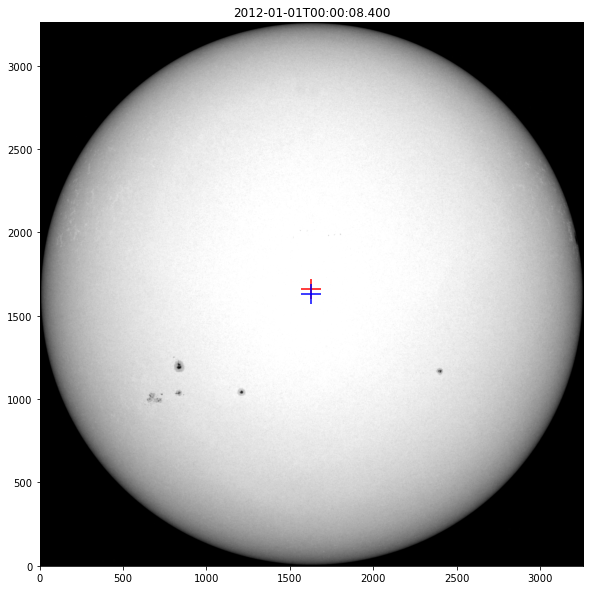

('/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-01-31.png',
 array([1627.92526525, 1657.28612837]))

In [534]:
plotCentroid(aia_submap)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/var/folders/jy/sjsyz6954zv918vnjmc0xzfr0000gn/T/ipykernel_22226/3255856949.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (10, 10))
/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


plotted


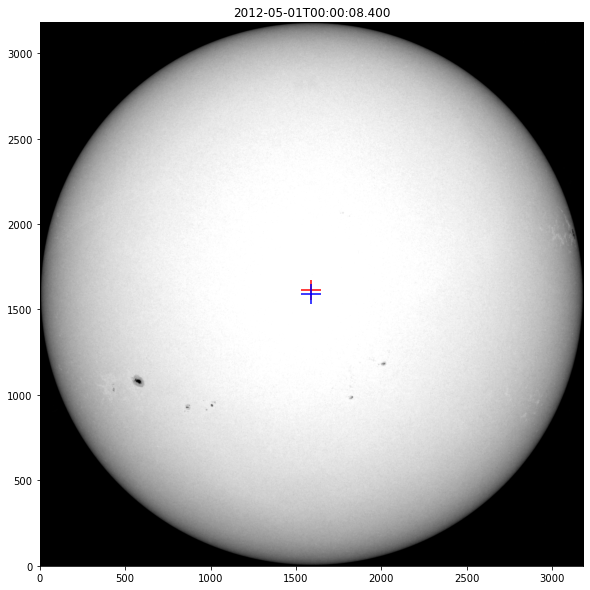

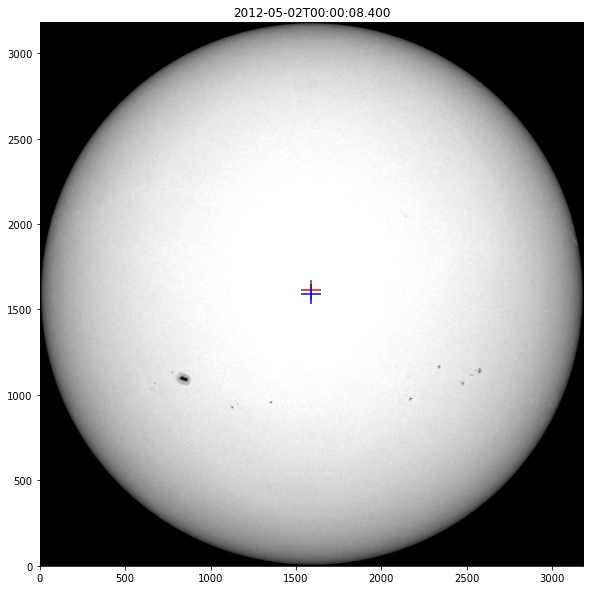

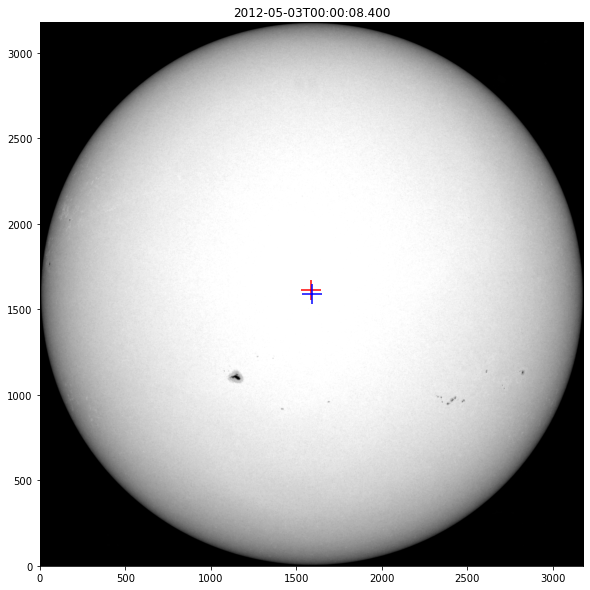

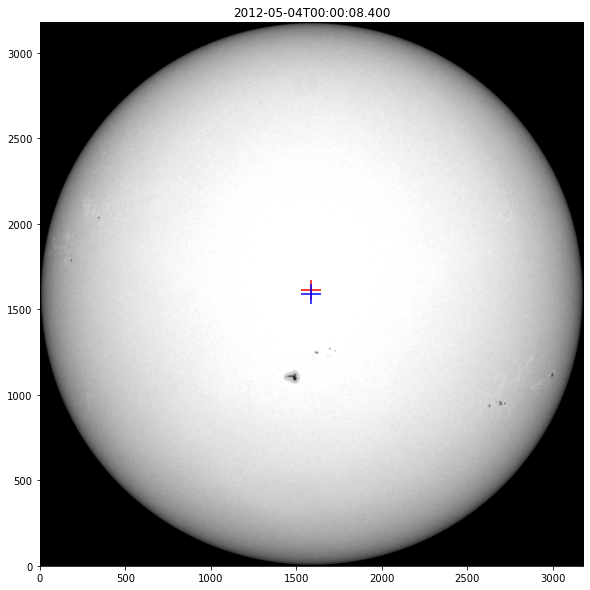

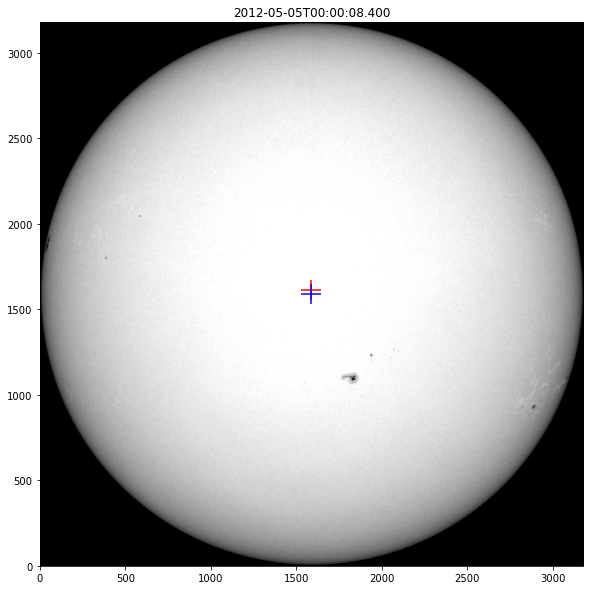

...

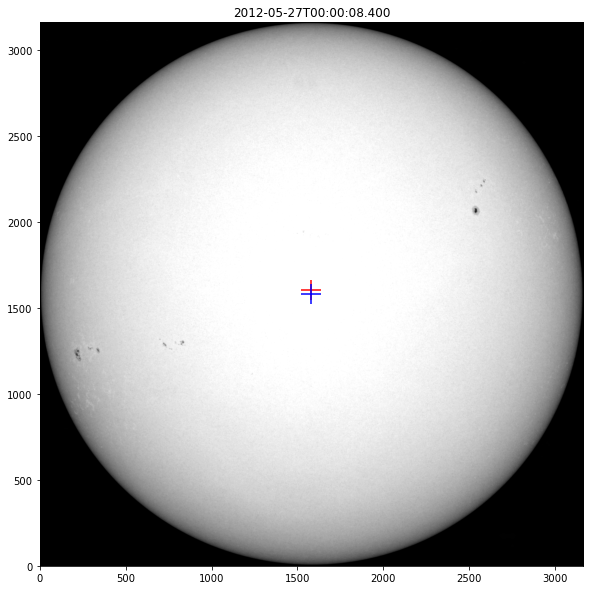

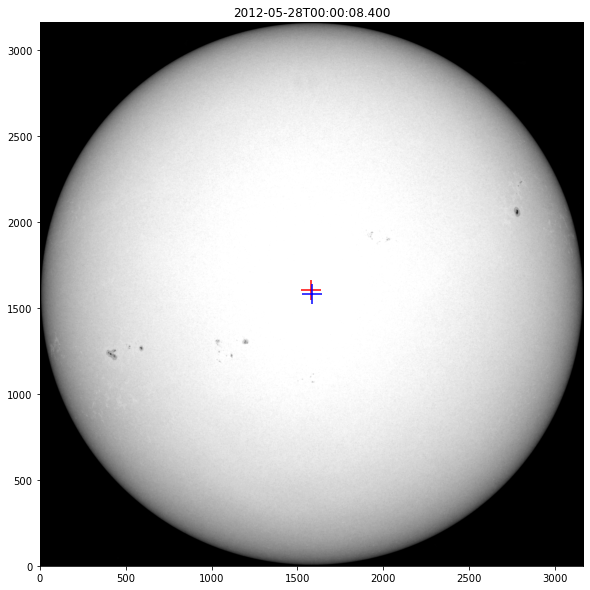

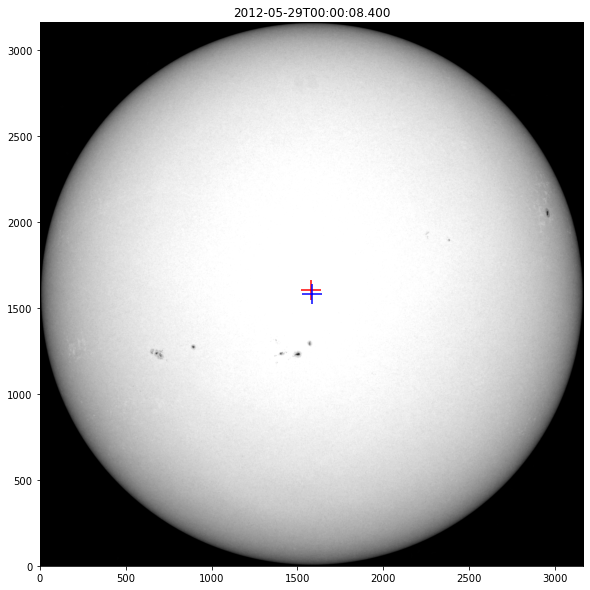

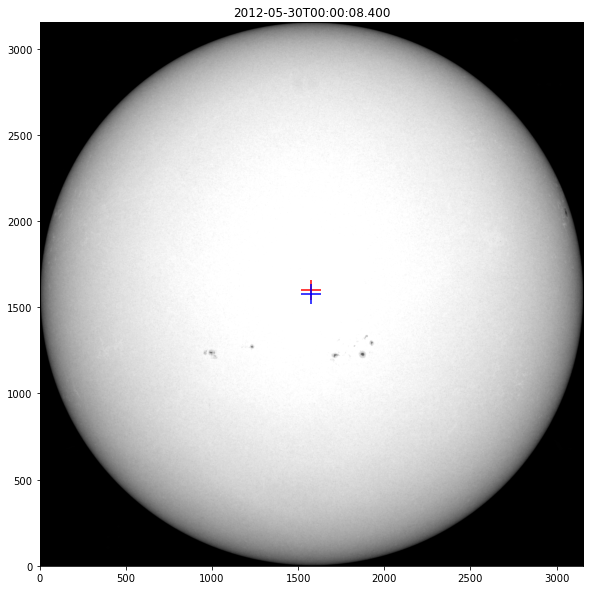

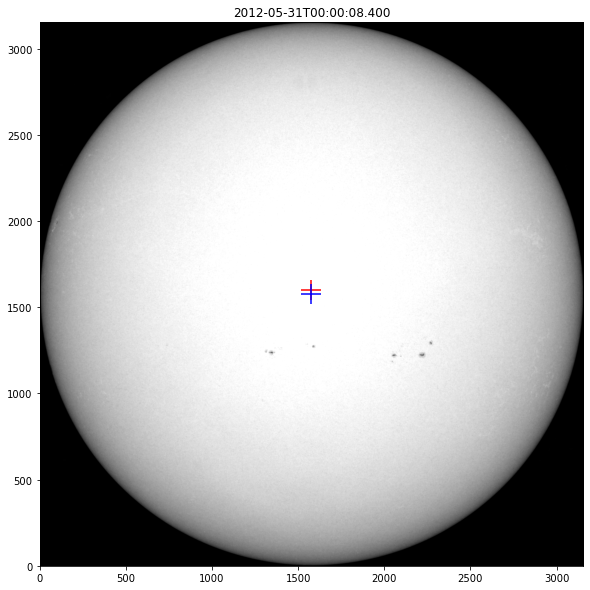

In [415]:
filenames = []
deltas = []
for i in range(1, 32):
    if i < 10:
        date = f'0{i}'
    else:
        date = f'{i}'
    file = hv.download_jp2('2012/05/' + date, observatory="SDO", instrument="AIA", measurement="4500")

    sun_map = Map(file)
    bound = sunpy.map.on_disk_bounding_coordinates(sun_map)
    sun_map_bound = sun_map.submap(bound[0], top_right = bound[1])
    
    result = plotCentroid(sun_map_bound, show_plot = False, save_fig = True, obs_date = date)
    filenames.append(result[0])
    deltas.append(result[1])

In [416]:
filenames

['/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-01.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-02.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-03.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-04.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-05.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-06.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-07.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-08.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-09.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-10.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-11.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-12.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-13.png',
 '/Users/waritwij/Documents/GitHub/astro_jitter/maps/2012-05-14.png',
 '/Users/waritwij/Do

In [417]:
deltas

[(-2.6233335639194593, 25.185308239416827),
 (-2.6826947321203534, 25.407705527079315),
 (-2.9283399234834633, 25.45095239875718),
 (-2.8648324896216764, 25.369907319522326),
 (-2.961424146442141, 25.40387582041285),
 (-3.1137396018930303, 25.39601731037942),
 (-2.8287024091755484, 25.344800916616123),
 (-2.122348908623735, 24.982984051599942),
 (-2.4033407709230232, 24.797743765966743),
 (-2.4309424374898754, 24.749894960936217),
 (-2.8609069591961998, 24.66141373742562),
 (-2.929846403934107, 25.613236833107294),
 (-2.7935774143993513, 25.595789262384415),
 (-3.1101215811204383, 25.701404188776678),
 (-2.955286320732739, 25.72627574943499),
 (-2.763027681456606, 25.0120557660307),
 (-3.2752132889261247, 24.2303243458623),
 (-3.59662421440612, 24.249020287774783),
 (-3.8376977272673685, 24.230568213882407),
 (-3.8617346208648087, 24.17092521750942),
 (-3.7659282121983324, 24.20779499503601),
 (-3.415323027574459, 25.017434565588474),
 (-4.171301141151844, 24.36256264761232),
 (-2.8965

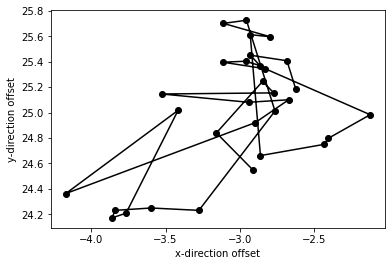

In [418]:
x = np.array([])
y = np.array([])

for delta in deltas:
    x = np.append(x, delta[0])
    y = np.append(y, delta[1])

dist = np.sqrt(np.square(x) + np.square(y))

plt.plot(x, y, '-ok')
plt.xlabel('x-direction offset')
plt.ylabel('y-direction offset')
plt.show()

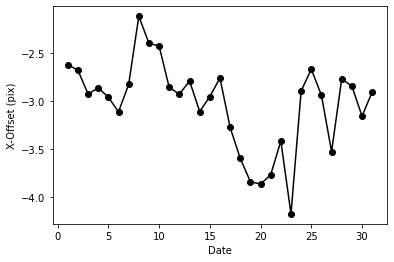

In [419]:
date = np.arange(1, len(deltas) + 1)
plt.plot(date, x, '-ok')
plt.xlabel('Date')
plt.ylabel('X-Offset (pix)')
plt.show()

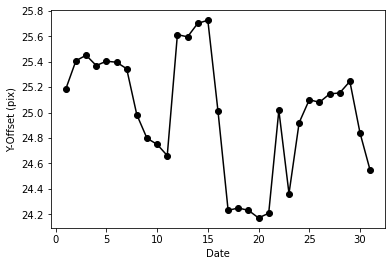

In [420]:
plt.plot(date, y, '-ok')
plt.xlabel('Date')
plt.ylabel('Y-Offset (pix)')
plt.show()

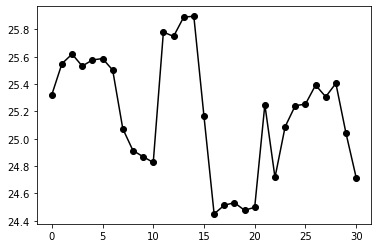

In [421]:
plt.plot(dist, '-ok')

In [422]:
# Build GIF
with imageio.get_writer(filenames[0][-14:-4] + ' to ' + filenames[-1][-14:-4] + '.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

In [118]:
a 

array([[  0,   2,   0, ...,   0,   0,   0],
       [252,   0,   2, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [109]:
file2 = hv.download_jp2('2012/01/19', observatory="SDO", instrument="AIA", measurement="4500")
aia2 = Map(file2)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

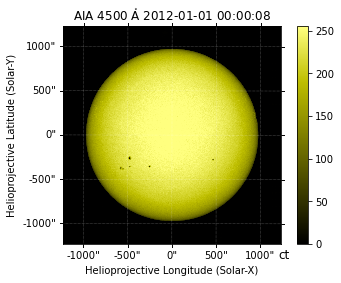

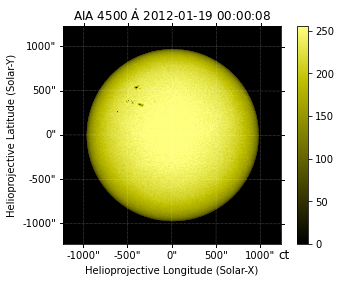

In [110]:
aia.peek()
aia2.peek()

In [111]:
print(aia.data)
aia2.data.size

[[  0   2   0 ...   0   0   0]
 [252   0   2 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


16777216

In [22]:
# shift = coal.calculate_shift(a, a2)

In [23]:
# coal.apply_shifts(aia2, shift[0], shift[1])

In [113]:
mapseq = MapSequence([aia, aia2])

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.8899 2047. ] pix

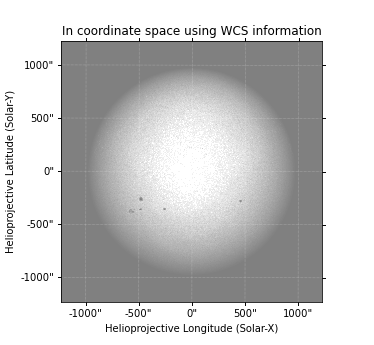
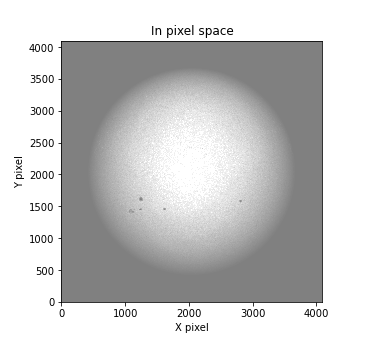
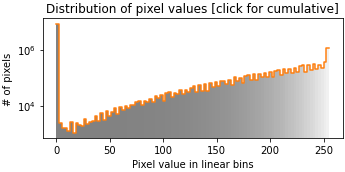
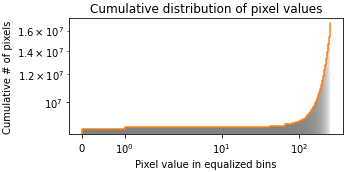
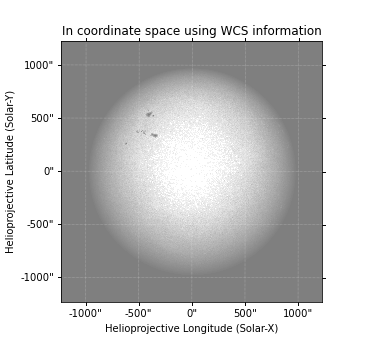
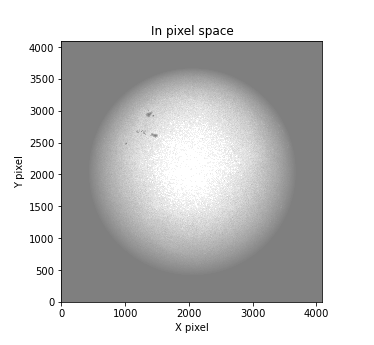
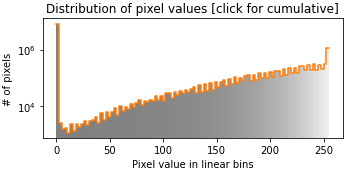
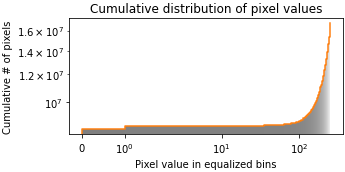

In [114]:
mapseq

In [37]:
mapseq_aligned = coal.mapsequence_coalign_by_match_template(mapseq)

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[4095. 4095.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.8899 2047. ] pix

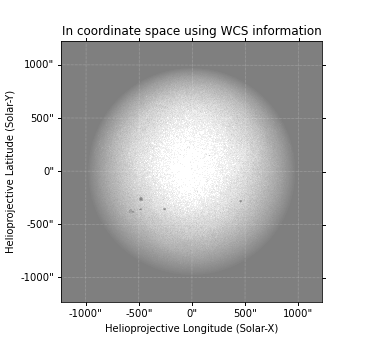
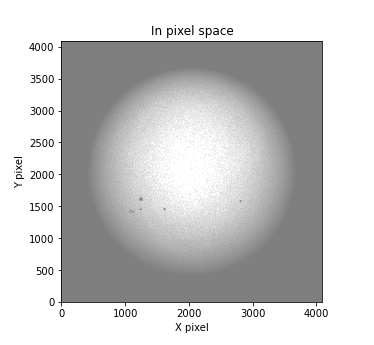
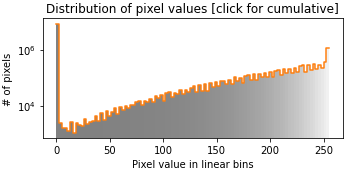
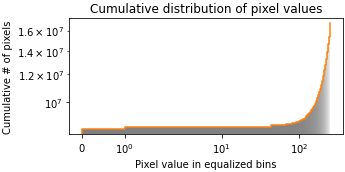
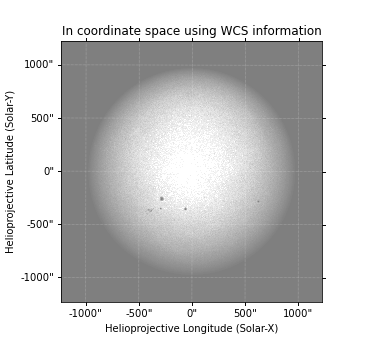
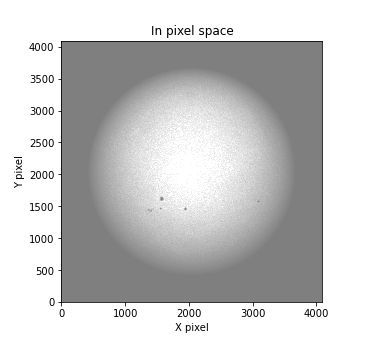
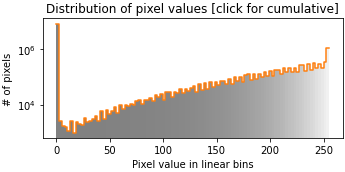
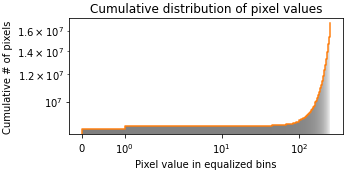

In [38]:
mapseq_aligned

In [72]:
pic0 = mapseq_aligned[0].data
pic0

array([[252,   0,   2, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [73]:
pic1 = mapseq_aligned[1].data
pic1

array([[248,   0,   2, ...,   0,   0,   0],
       [ 12,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

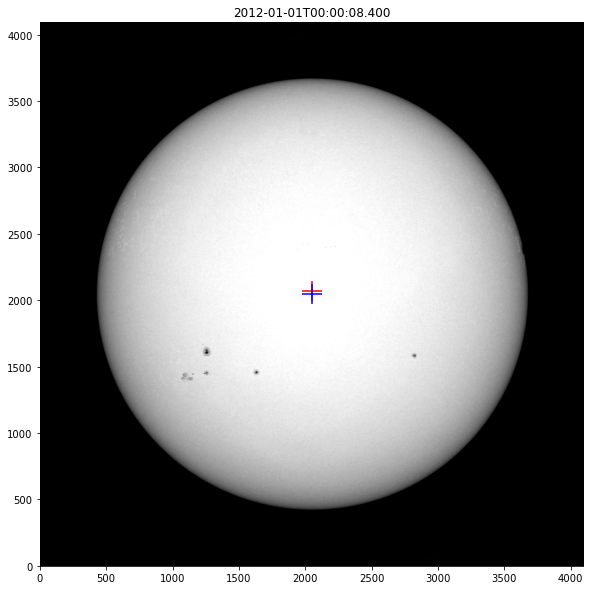

[2048.93857679 2073.2759202 ]
PixelPair(x=<Quantity 2050.8899 pix>, y=<Quantity 2047. pix>)


In [80]:
centerr = cen(pic0)
ref = mapseq_aligned[0].reference_pixel

plt.figure(figsize = (10, 10))
plt.imshow(pic0, origin = 'lower', cmap = 'gray', vmin = 0, vmax = 255)
plt.scatter(centerr[0], centerr[1], s = 400, color = 'r', marker = '+')
plt.scatter(ref[0], ref[1], s = 400, color = 'b', marker = '+')
plt.title(mapseq_aligned[0].date)
file_name = '/Users/waritwij/Documents/GitHub/astro_jitter/' + mapseq_aligned[0].date.value[:10] + '_aligned.png'
plt.savefig(file_name, format = 'png')
plt.show()

print(centerr)
print(ref)

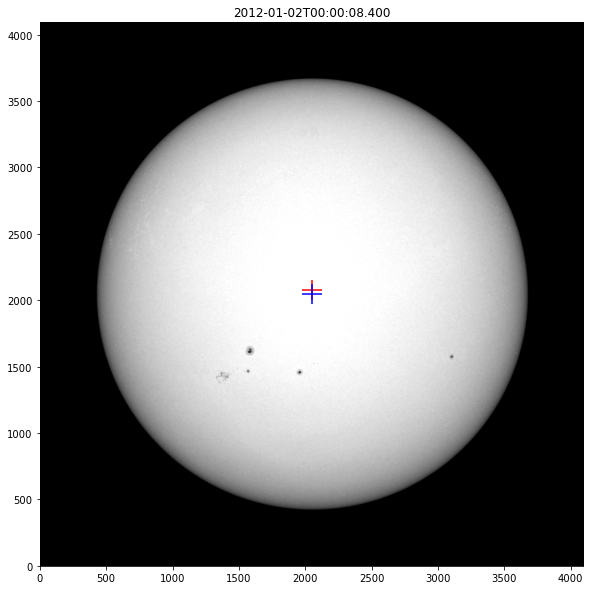

[2048.87289514 2073.43266175]
PixelPair(x=<Quantity 2050.88623308 pix>, y=<Quantity 2047.05022713 pix>)


In [81]:
centerr1 = cen(pic1)
reff = mapseq_aligned[1].reference_pixel

plt.figure(figsize = (10, 10))
plt.imshow(pic1, origin = 'lower', cmap = 'gray', vmin = 0, vmax = 255)
plt.scatter(centerr1[0], centerr1[1], s = 400, color = 'r', marker = '+')
plt.scatter(reff[0], reff[1], s = 400, color = 'b', marker = '+')
plt.title(mapseq_aligned[1].date)
file_name = '/Users/waritwij/Documents/GitHub/astro_jitter/' + mapseq[1].date.value[:10] + '_aligned.png'
plt.savefig(file_name, format = 'png')
plt.show()
print(centerr1)
print(reff)

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.8899 2047. ] pix

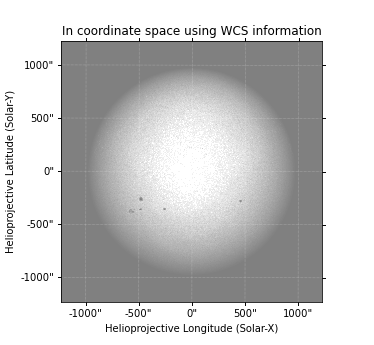
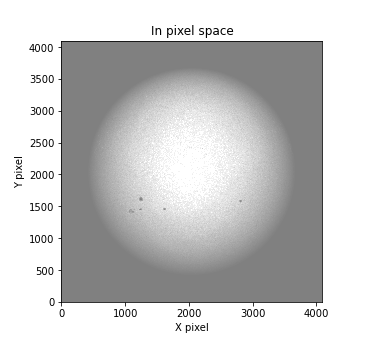
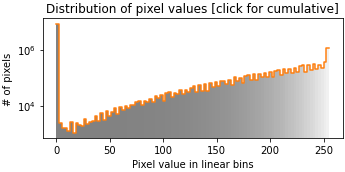
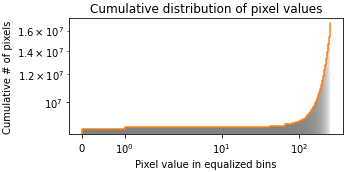

In [62]:
aia

In [68]:
aia.reference_pixel

PixelPair(x=<Quantity 2050.8899 pix>, y=<Quantity 2047. pix>)

In [96]:
bound = sunpy.map.on_disk_bounding_coordinates(aia)

<SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (-975.6924288, -975.7540387)>

In [104]:
print(bound[0])
print(bound[1])

<SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (-975.6924288, -975.7540387)>
<SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (975.81374781, 975.75427499)>


In [105]:
aia_submap = aia.submap(bound[0], top_right = bound[1])

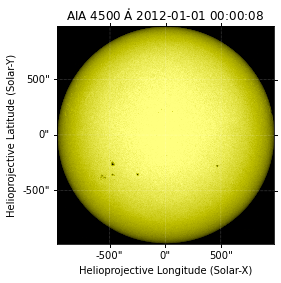

In [106]:
aia_submap.plot()

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[3261. 3261.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1629.8899 1630. ] pix

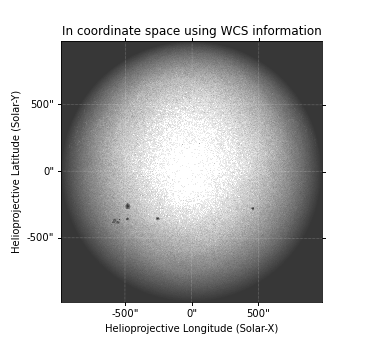
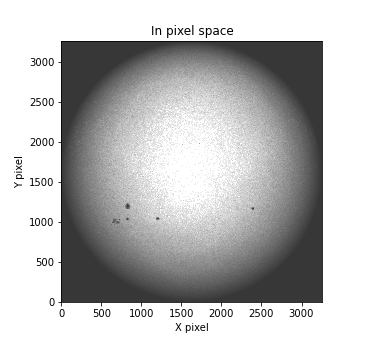
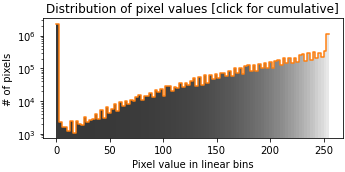
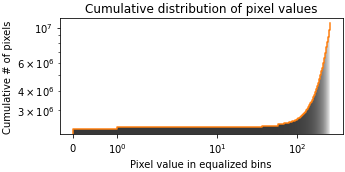

In [108]:
aia_submap

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-19 00:00:08
Exposure Time,0.500321 s
Dimension,[3260. 3259.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1629.46 1628.95] pix

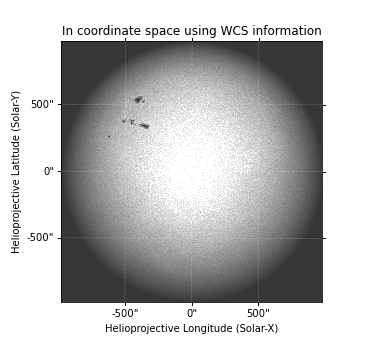
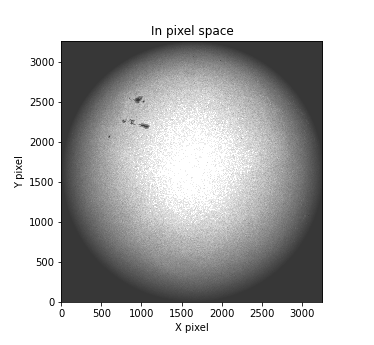
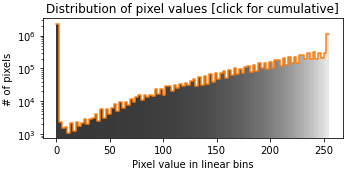
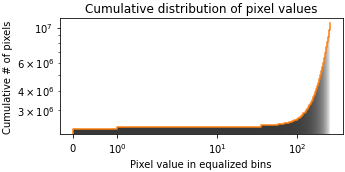

In [121]:
bound2 = sunpy.map.on_disk_bounding_coordinates(aia2)
aia2_submap =  aia2.submap(bound2[0], top_right = bound2[1])
aia2_submap

In [127]:
arr = np.array([[0, 0, 0, 0, 0],
                [0, 1, 1, 1, 0],
                [0, 2, 3, 2, 0],
                [0, 1, 1, 1, 0],
                [0, 0, 0, 0, 0]])
arr

array([[0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0],
       [0, 2, 3, 2, 0],
       [0, 1, 1, 1, 0],
       [0, 0, 0, 0, 0]])

In [128]:
cen(arr)

array([2., 2.])

In [134]:
arr2 = np.array([[0, 1, 1, 1, 0],
                 [0, 2, 3, 2, 0],
                 [0, 1, 1, 1, 0],
                 [0, 0, 0, 0, 0],
                 [0, 0, 0, 0, 0]])
arr2

array([[0, 1, 1, 1, 0],
       [0, 2, 3, 2, 0],
       [0, 1, 1, 1, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]])

In [135]:
print(cen(arr2))
print(ndimage.measurements.center_of_mass(arr2))

[2. 1.]
(1.0, 2.0)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-19 00:00:08
Exposure Time,0.500321 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.46 2046.95] pix

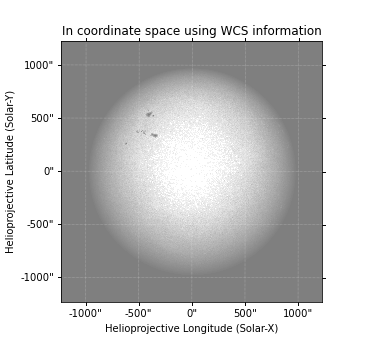
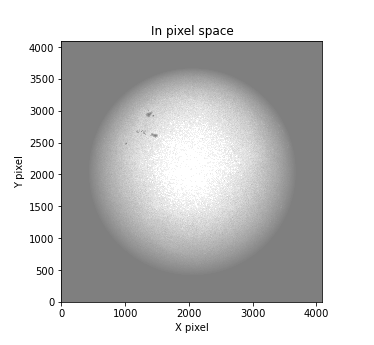
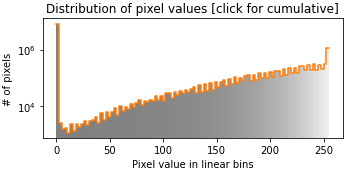
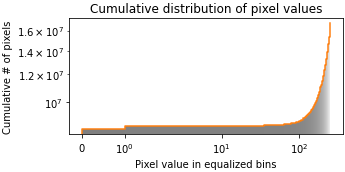

In [317]:
# file = hv.download_jp2('2012/01/19', observatory="SDO", instrument="AIA", measurement="4500")
# themap = Map(file)
# themap

In [318]:
# b = sunpy.map.on_disk_bounding_coordinates(themap)
# print(b[0])
# print(b[1])

<SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (-975.40996644, -975.13242516)>
<SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (975.44711558, 975.18819383)>


Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-19 00:00:08
Exposure Time,0.500321 s
Dimension,[3260. 3259.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1629.46 1628.95] pix

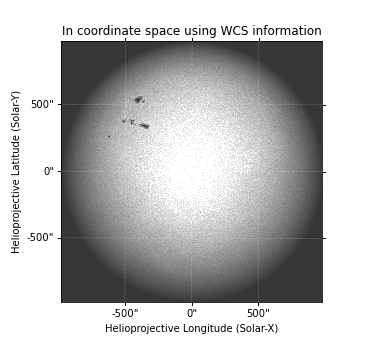
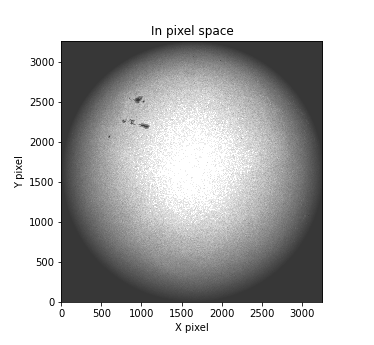
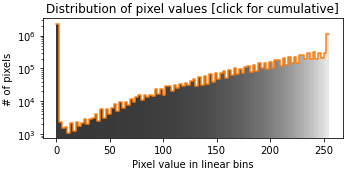
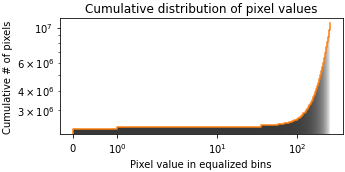

In [319]:
# thesubmap = themap.submap(b[0], top_right =  b[1])
# thesubmap

In [320]:
# cof = cen(thesubmap.data)
# print(cof)
# reff = thesubmap.reference_pixel
# print(reff)

[1638.93767766 1652.01636861]
PixelPair(x=<Quantity 1629.46 pix>, y=<Quantity 1628.95 pix>)


In [321]:
# reff.x.value

1629.46

In [322]:
# sunpy.map.contains_solar_center(thesubmap)

True

In [329]:
# thesubmap.center

<SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (0.02393465, 0.03002818)>

In [324]:
# thesubmap.reference_coordinate

<SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (0., 0.)>

In [325]:
# thesubmap.world_to_pixel(thesubmap.center)

PixelPair(x=<Quantity 1629.5 pix>, y=<Quantity 1629. pix>)

In [326]:
# thesubmap.world_to_pixel(thesubmap.reference_coordinate)

PixelPair(x=<Quantity 1629.46 pix>, y=<Quantity 1628.95 pix>)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-18 00:00:08
Exposure Time,0.501043 s
Dimension,[3260. 3259.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1629.46 1628.95] pix

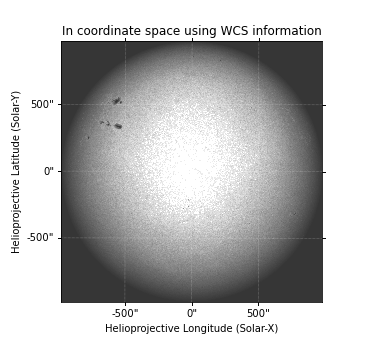
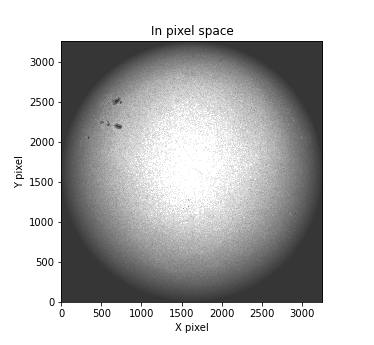
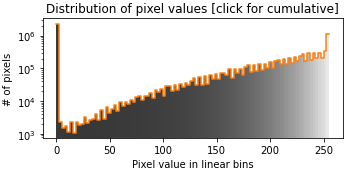
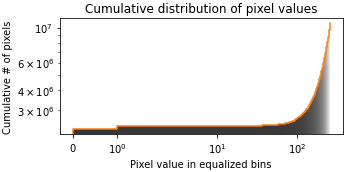

In [429]:
file2 = hv.download_jp2('2012/01/18', observatory="SDO", instrument="AIA", measurement="4500")
themap2 = Map(file2)
b2 = sunpy.map.on_disk_bounding_coordinates(themap2)
thesubmap2 = themap2.submap(b2[0], top_right =  b2[1])
thesubmap2

In [369]:
print(thesubmap2.center)
print(thesubmap2.reference_coordinate)
print(thesubmap2.reference_pixel)

<SkyCoord (Helioprojective: obstime=2012-01-18T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-18T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01550712, -4.78675622, 1.47161874e+11)>): (Tx, Ty) in arcsec
    (0.02393461, 0.03002821)>
<SkyCoord (Helioprojective: obstime=2012-01-18T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-18T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01550712, -4.78675622, 1.47161874e+11)>): (Tx, Ty) in arcsec
    (0., 0.)>
PixelPair(x=<Quantity 1629.46 pix>, y=<Quantity 1628.95 pix>)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[3261. 3261.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1629.8899 1630. ] pix

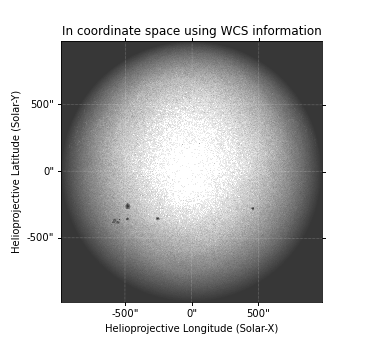
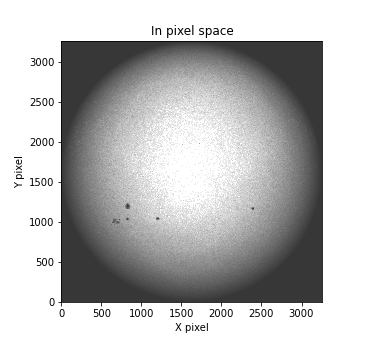
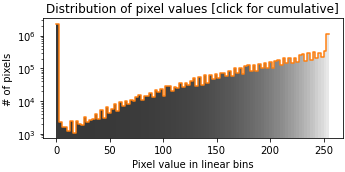
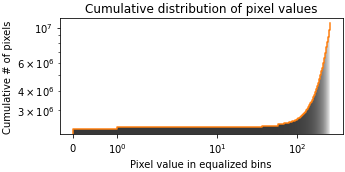

In [428]:
file = hv.download_jp2('2012/01/01', observatory="SDO", instrument="AIA", measurement="4500")
themap = Map(file)
b = sunpy.map.on_disk_bounding_coordinates(themap)
thesubmap = themap.submap(b[0], top_right =  b[1])
thesubmap

In [337]:
print(thesubmap.center)
print(thesubmap.reference_coordinate)
print(thesubmap.reference_pixel)

<SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (0.06602763, 0.00011818)>
<SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (0., 0.)>
PixelPair(x=<Quantity 1629.8899 pix>, y=<Quantity 1630. pix>)


center =  <SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (0.06602763, 0.00011818)>
ref =  <SkyCoord (Helioprojective: obstime=2012-01-01T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-01T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01599248, -2.9458659, 1.47095448e+11)>): (Tx, Ty) in arcsec
    (0., 0.)>
cof =  [1627.92526525 1657.28612837]


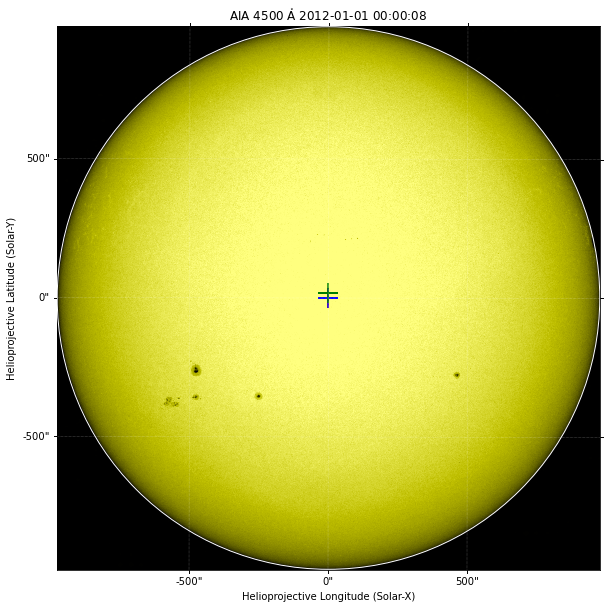

In [366]:
plt.figure(figsize = (10, 10))
thesubmap.plot()
thesubmap.draw_limb()

center = thesubmap.world_to_pixel(thesubmap.center)
print('center = ', thesubmap.center)
ref = thesubmap.world_to_pixel(thesubmap.reference_coordinate)
print('ref = ', thesubmap.reference_coordinate)
cof = cen(thesubmap.data)
print('cof = ', cof)

plt.scatter(center[0], center[1], s = 400, color = 'r', marker = '+')
plt.scatter(ref[0], ref[1], s = 400, color = 'b', marker = '+')
plt.scatter(cof[0], cof[1], s = 400, color = 'g', marker = '+')

center =  <SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (0.02393465, 0.03002818)>
ref =  <SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (0., 0.)>
cof pixel =  [1638.93767766 1652.01636861]
cof coord =  <SkyCoord (Helioprojective: obstime=2012-01-19T00:00:08.400, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2012-01-19T00:00:08.400, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01544367, -4.88310414, 1.47173438e+11)>): (Tx, Ty) in arcsec
    (5.65909498, 13.84320002)>


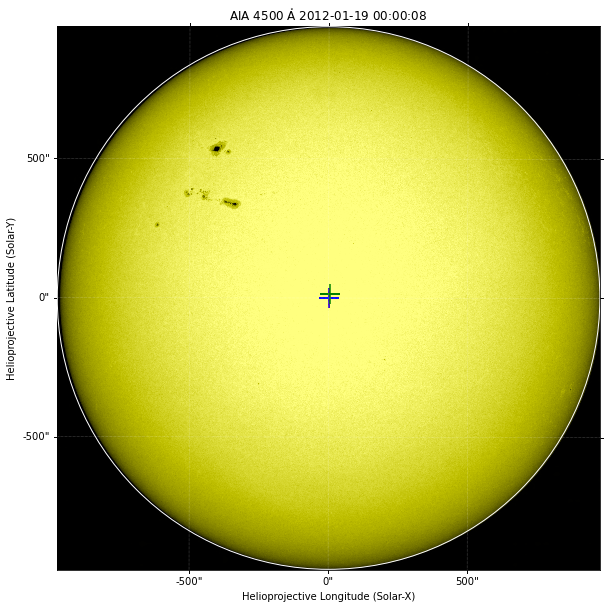

In [364]:
plt.figure(figsize = (10, 10))
thesubmap2.plot()
thesubmap2.draw_limb()

center2 = thesubmap2.world_to_pixel(thesubmap2.center)
print('center = ', thesubmap2.center)
ref2 = thesubmap2.world_to_pixel(thesubmap2.reference_coordinate)
print('ref = ', thesubmap2.reference_coordinate)
cof2 = cen(thesubmap2.data)
print('cof pixel = ', cof2)
print('cof coord = ', thesubmap2.pixel_to_world(cof2[0]*u.pixel, cof2[1]*u.pixel))

plt.scatter(center2[0], center2[1], s = 400, color = 'r', marker = '+')
plt.scatter(ref2[0], ref2[1], s = 400, color = 'b', marker = '+')
plt.scatter(cof2[0], cof2[1], s = 400, color = 'g', marker = '+')

In [371]:
dates = []
center_deltas = []
ref_deltas = []
for i in range(1, 32):
    
    if i < 10:
        date = f'0{i}'
    else:
        date = f'{i}'
    
    dates.append(i)
    
    file = hv.download_jp2('2012/01/' + date, observatory="SDO", instrument="AIA", measurement="4500")
    sun_map = Map(file)
    bound = sunpy.map.on_disk_bounding_coordinates(sun_map)
    sun_map_bound = sun_map.submap(bound[0], top_right = bound[1])
    
    center = sun_map_bound.world_to_pixel(sun_map_bound.center)
    ref = sun_map_bound.reference_pixel
    cof = cen(sun_map_bound.data)
    
    center_deltas.append((cof[0] - center.x.value, cof[1] - center.y.value))
    ref_deltas.append((cof[0] - ref.x.value, cof[1] - ref.y.value))

print(date)
print(center_deltas)
print(ref_deltas)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

31
[(-2.074734746802278, 27.286128365335117), (-2.1478947093357874, 27.463049566059908), (-2.1338410072785337, 27.2635528749895), (-1.7946177194919528, 26.476851566149662), (-0.8448503839763362, 25.451998751181918), (-0.5510761493458176, 25.452645891935163), (-0.6779752961538179, 25.365196058886113), (-0.7662346752233589, 25.153356754562083), (-0.9775257829301154, 25.170952856036138), (-1.2059098018526129, 25.70075577755074), (-1.3642007854375606, 26.06681995103054), (-1.1928863865266521, 26.099613413342013), (-1.6071882312444359, 26.42574202826995), (-1.5205524802518084, 26.98574355073015), (-1.7249867360540065, 26.88893094256605), (-1.6928148412314385, 26.99290717111262), (-1.4470120990692976, 26.258271456812054), (-0.9404273314032707, 26.5806537032945), (9.437677659043857, 23.016368606513424), (9.827244553493074, 22.427430523270232), (10.402112093788674, 21.9746596447676), (-0.9149915600455643, 25.469508583362767), (-0.8465402313681807, 25.538960167140658), (-0.5373724825053614, 25.

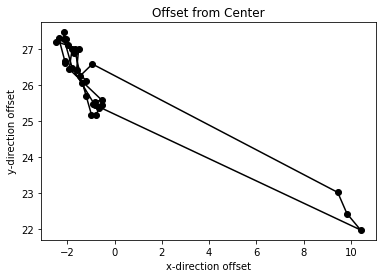

In [379]:
cx = np.array([])
cy = np.array([])

for delta in center_deltas:
    cx = np.append(cx, delta[0])
    cy = np.append(cy, delta[1])

cdist = np.sqrt(np.square(cx) + np.square(cy))

plt.plot(cx, cy, '-ok')
plt.xlabel('x-direction offset')
plt.ylabel('y-direction offset')
plt.title('Offset from Center')
plt.show()

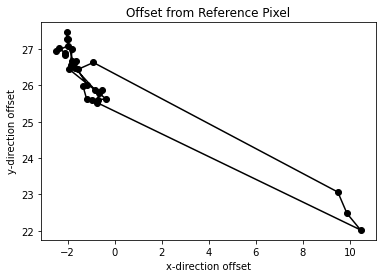

In [380]:
rx = np.array([])
ry = np.array([])

for delta in ref_deltas:
    rx = np.append(rx, delta[0])
    ry = np.append(ry, delta[1])

rdist = np.sqrt(np.square(rx) + np.square(ry))

plt.plot(rx, ry, '-ok')
plt.xlabel('x-direction offset')
plt.ylabel('y-direction offset')
plt.title('Offset from Reference Pixel')
plt.show()

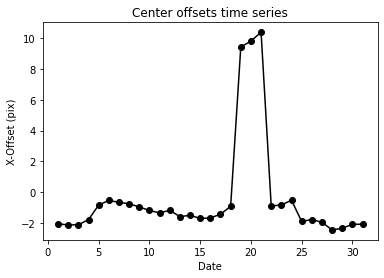

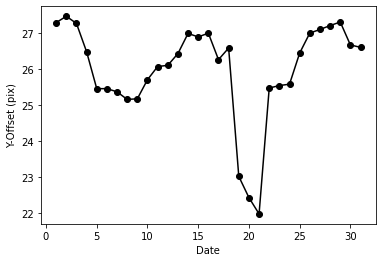

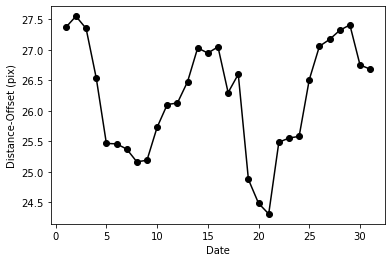

In [382]:
plt.plot(dates, cx, '-ok')
plt.xlabel('Date')
plt.ylabel('X-Offset (pix)')
plt.title('Center offsets time series')
plt.show()

plt.plot(dates, cy, '-ok')
plt.xlabel('Date')
plt.ylabel('Y-Offset (pix)')
plt.show()

plt.plot(dates, cdist, '-ok')
plt.xlabel('Date')
plt.ylabel('Distance-Offset (pix)')
plt.show()

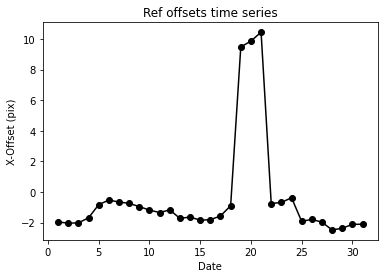

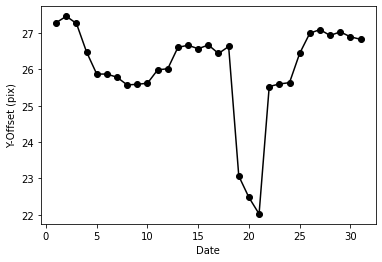

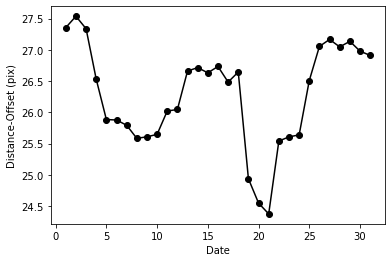

In [383]:
plt.plot(dates, rx, '-ok')
plt.xlabel('Date')
plt.ylabel('X-Offset (pix)')
plt.title('Ref offsets time series')
plt.show()

plt.plot(dates, ry, '-ok')
plt.xlabel('Date')
plt.ylabel('Y-Offset (pix)')
plt.show()

plt.plot(dates, rdist, '-ok')
plt.xlabel('Date')
plt.ylabel('Distance-Offset (pix)')
plt.show()

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-05-24 16:00:08
Exposure Time,0.500862 s
Dimension,[3166. 3166.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[1582.71 1582.24] pix

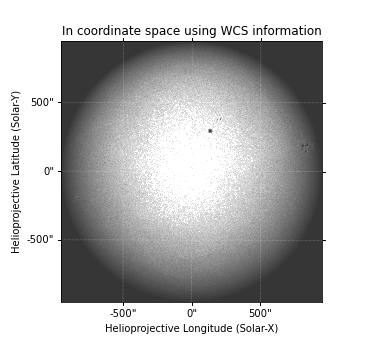
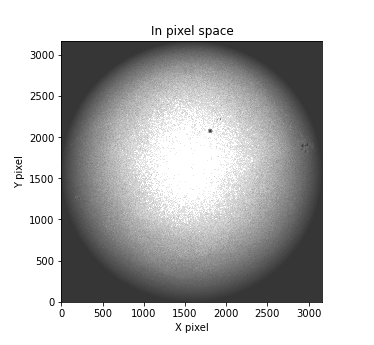
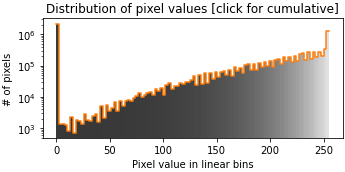
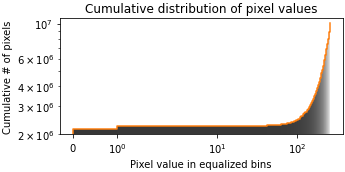

In [423]:
file = hv.download_jp2('2012/05/25', observatory="SDO", instrument="AIA", measurement="4500")
themap = Map(file)
b = sunpy.map.on_disk_bounding_coordinates(themap)
thesubmap = themap.submap(b[0], top_right =  b[1])
thesubmap

(<matplotlib.patches.Circle at 0x7face9170ca0>, None)

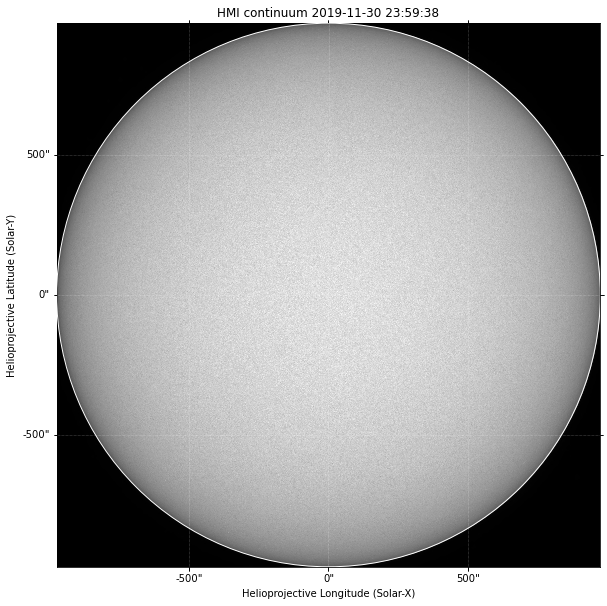

In [403]:
plt.figure(figsize = (10,10))
thesubmap.plot() 

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

Observatory,SDO
Instrument,HMI FRONT2
Detector,HMI
Measurement,continuum
Wavelength,6173.0
Observation Date,2019-11-30 23:59:38
Exposure Time,Unknown
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

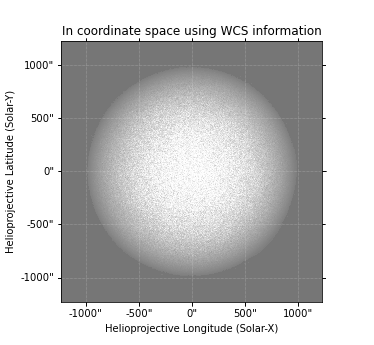
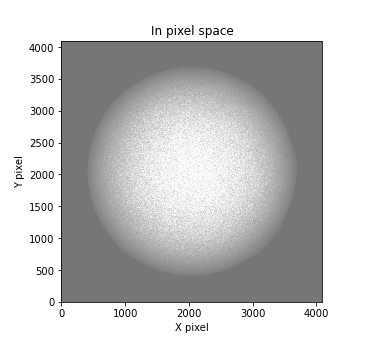
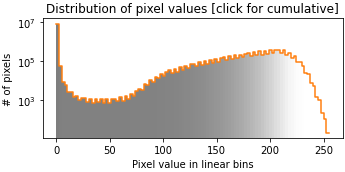
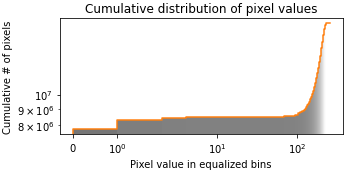

In [531]:
file_hmi = hv.download_jp2('2019/12/01', observatory="SDO", instrument="HMI", measurement="continuum")
themap_hmi = Map(file_hmi)
themap_hmi

/Users/waritwij/opt/anaconda3/envs/astro_jitter_env/lib/python3.8/site-packages/astropy/time/formats.py:1372: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  val1_uint32 = val1.view((np.uint32, val1.dtype.itemsize // 4))


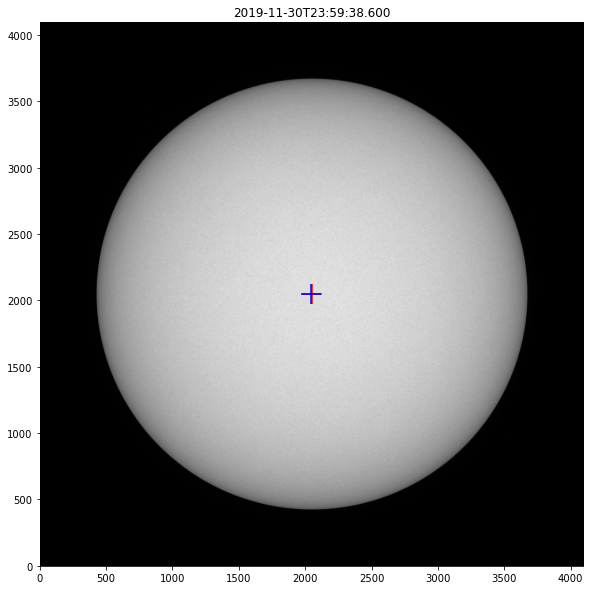

('/Users/waritwij/Documents/GitHub/astro_jitter/maps/2019-11-31.png',
 (1.917720143511815, -0.236253307612742))

In [532]:
plotCentroid(themap_hmi)

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-01 00:00:08
Exposure Time,0.500957 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.8899 2047. ] pix

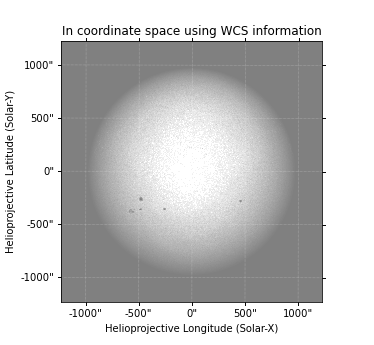
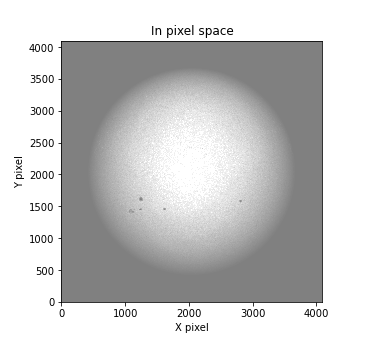
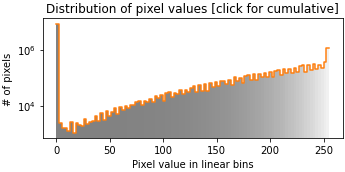
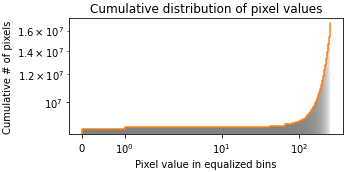

In [430]:
themap

Observatory,SDO
Instrument,AIA 3
Detector,AIA
Measurement,4500.0 Angstrom
Wavelength,4500.0 Angstrom
Observation Date,2012-01-18 00:00:08
Exposure Time,0.501043 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.599707 0.599707] arcsec / pix
Reference Pixel,[2050.46 2046.95] pix

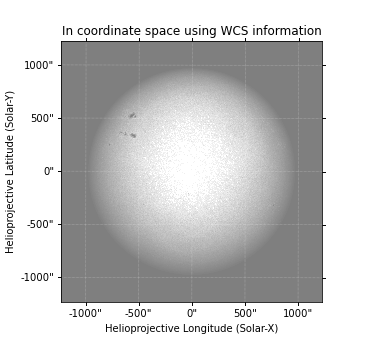
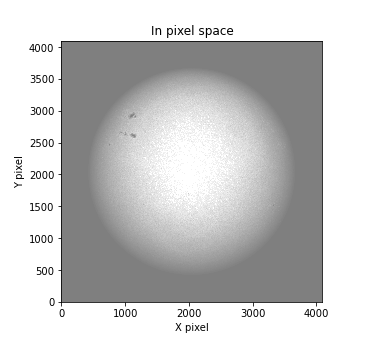
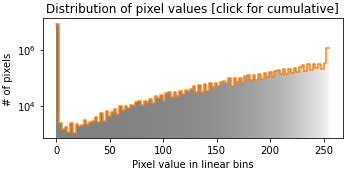
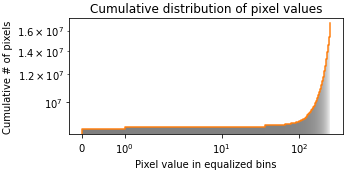

In [431]:
themap2

(-0.5, 4095.5, -0.5, 4095.5)

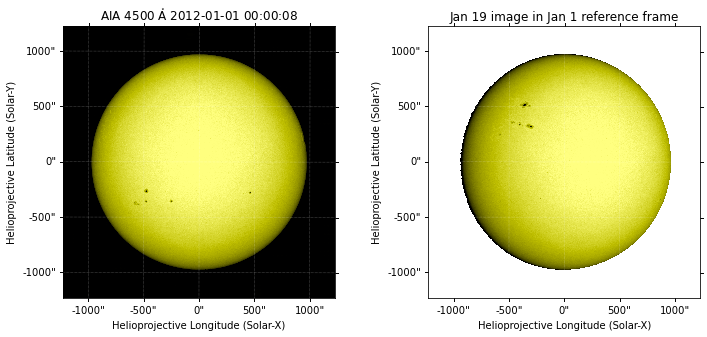

In [432]:
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(121, projection=themap)
themap.plot(axes=ax1, clip_interval=(1, 99.9)*u.percent)
ax2 = fig.add_subplot(122, projection=themap)
themap2.plot(axes=ax2, autoalign=True, title='Jan 19 image in Jan 1 reference frame')
ax2.axis(ax1.axis())

In [433]:
thenewmap2 = themap2.reproject_to(themap.wcs)

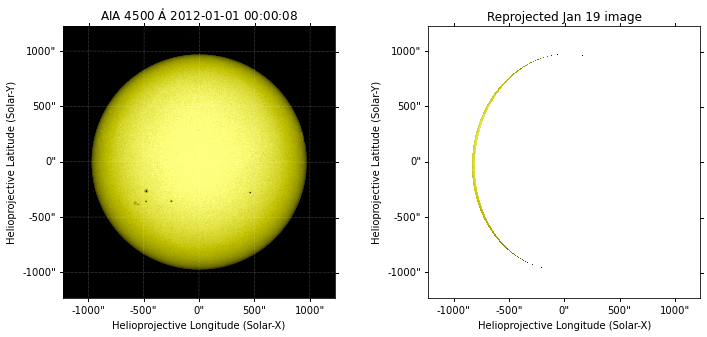

In [434]:
fig = plt.figure(figsize=(12, 5))
ax1 = fig.add_subplot(121, projection=themap)
themap.plot(axes=ax1, clip_interval=(1, 99.9)*u.percent)
ax2 = fig.add_subplot(122, projection=thenewmap2)
thenewmap2.plot(axes=ax2, title='Reprojected Jan 19 image')

In [448]:
themap.wcs

astropy.wcs.wcs.WCS

In [461]:
themap.wcs.wcs_world2pix(0, 0, 0)

[array(2050.8899), array(2047.)]

In [499]:
xcens = np.zeros(31)
ycens = np.zeros(31)
xrefs = np.zeros(31)
yrefs = np.zeros(31)

for i in range(31):
    if i < 9:
        date = f'0{i+1}'
    else:
        date = f'{i+1}'
    file = hv.download_jp2('2012/01/' + date, observatory="SDO", instrument="AIA", measurement="4500")

    sun_map = Map(file)
    print(sun_map.wcs.wcs_world2pix(0, 0, 0))
    xrefs[i] = sun_map.wcs.wcs_world2pix(0, 0, 0)[0]
    yrefs[i] = sun_map.wcs.wcs_world2pix(0, 0, 0)[1]
    c = cen(sun_map.data)
    print(c)
    xcens[i] = c[0]
    ycens[i] = c[1]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.8899), array(2047.)]
[2048.93868586 2074.27587604]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.8899), array(2047.)]
[2048.87373852 2074.42398459]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.8899), array(2047.)]
[2048.87879939 2074.24275966]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.8899), array(2047.)]
[2049.21949311 2073.45725288]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2049.18008959 2073.4324032 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2049.47854055 2073.420715  ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2049.35471489 2073.3617962 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2049.2509982  2073.12640578]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2049.03802109 2073.14873324]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2048.8254169  2073.18759158]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2048.64761525 2073.54202061]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2049.98), array(2047.5801)]
[2048.81909515 2073.57566777]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.6201), array(2046.8199)]
[2048.89740654 2073.41062036]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.6201), array(2046.8199)]
[2049.00929534 2073.43964154]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.6201), array(2046.8199)]
[2048.78912675 2073.38644873]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.6201), array(2046.8199)]
[2048.82613564 2073.46940678]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.6201), array(2046.8199)]
[2049.06995297 2073.23775521]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.46), array(2046.95)]
[2049.57412995 2073.55525712]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.46), array(2046.95)]
[2059.95424339 2070.00374462]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.46), array(2046.95)]
[2060.34866897 2069.39572849]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2050.46), array(2046.95)]
[2060.9479516  2068.95429994]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2061.3401), array(2043.4399)]
[2060.58665337 2068.95304843]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2061.3401), array(2043.4399)]
[2060.66017124 2069.04813748]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2061.3401), array(2043.4399)]
[2061.00432463 2069.02302723]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2047.5), array(2047.5)]
[2045.6136366  2073.92224107]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2047.5), array(2047.5)]
[2045.73055084 2074.48534098]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2047.5), array(2047.5)]
[2045.54856861 2074.58826698]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2062.51), array(2042.77)]
[2060.02056847 2069.6759925 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2062.51), array(2042.77)]
[2060.13148971 2069.78799369]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2062.51), array(2042.77)]
[2060.38974594 2069.6546444 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[array(2062.51), array(2042.77)]
[2060.39305563 2069.61032606]


In [491]:
print(xrefs)
print(yrefs)

[2050.8899 2050.8899 2050.8899 2050.8899 2049.98   2049.98   2049.98
 2049.98   2049.98   2049.98   2049.98   2049.98   2050.6201 2050.6201
 2050.6201 2050.6201 2050.6201 2050.46   2050.46   2050.46   2050.46
 2061.3401 2061.3401 2061.3401 2047.5    2047.5    2047.5    2062.51
 2062.51   2062.51   2062.51  ]
[2047.     2047.     2047.     2047.     2047.5801 2047.5801 2047.5801
 2047.5801 2047.5801 2047.5801 2047.5801 2047.5801 2046.8199 2046.8199
 2046.8199 2046.8199 2046.8199 2046.95   2046.95   2046.95   2046.95
 2043.4399 2043.4399 2043.4399 2047.5    2047.5    2047.5    2042.77
 2042.77   2042.77   2042.77  ]


In [492]:
xcens = np.zeros(31)
ycens = np.zeros(31)
for i in range(31):
    if i < 9:
        date = f'0{i+1}'
    else:
        date = f'{i+1}'
    file = hv.download_jp2('2012/01/' + date, observatory="SDO", instrument="AIA", measurement="4500")

    sun_map = Map(file)
    
    c = cen(sun_map.data)
    print(c)
    xcens[i] = c[0]
    ycens[i] = c[1]

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.93868586 2074.27587604]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.87373852 2074.42398459]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.87879939 2074.24275966]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.21949311 2073.45725288]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.18008959 2073.4324032 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.47854055 2073.420715  ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.35471489 2073.3617962 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.2509982  2073.12640578]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.03802109 2073.14873324]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.8254169  2073.18759158]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.64761525 2073.54202061]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.81909515 2073.57566777]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.89740654 2073.41062036]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.00929534 2073.43964154]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.78912675 2073.38644873]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2048.82613564 2073.46940678]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.06995297 2073.23775521]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2049.57412995 2073.55525712]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2059.95424339 2070.00374462]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.34866897 2069.39572849]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.9479516  2068.95429994]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.58665337 2068.95304843]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.66017124 2069.04813748]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2061.00432463 2069.02302723]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2045.6136366  2073.92224107]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2045.73055084 2074.48534098]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2045.54856861 2074.58826698]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.02056847 2069.6759925 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.13148971 2069.78799369]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.38974594 2069.6546444 ]


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

[2060.39305563 2069.61032606]


In [493]:
print(xcens)
print(ycens)

[2048.93868586 2048.87373852 2048.87879939 2049.21949311 2049.18008959
 2049.47854055 2049.35471489 2049.2509982  2049.03802109 2048.8254169
 2048.64761525 2048.81909515 2048.89740654 2049.00929534 2048.78912675
 2048.82613564 2049.06995297 2049.57412995 2059.95424339 2060.34866897
 2060.9479516  2060.58665337 2060.66017124 2061.00432463 2045.6136366
 2045.73055084 2045.54856861 2060.02056847 2060.13148971 2060.38974594
 2060.39305563]
[2074.27587604 2074.42398459 2074.24275966 2073.45725288 2073.4324032
 2073.420715   2073.3617962  2073.12640578 2073.14873324 2073.18759158
 2073.54202061 2073.57566777 2073.41062036 2073.43964154 2073.38644873
 2073.46940678 2073.23775521 2073.55525712 2070.00374462 2069.39572849
 2068.95429994 2068.95304843 2069.04813748 2069.02302723 2073.92224107
 2074.48534098 2074.58826698 2069.6759925  2069.78799369 2069.6546444
 2069.61032606]


In [514]:
xdeltas = xcens - xrefs
ydeltas = ycens - yrefs

In [515]:
print(xdeltas)
print(ydeltas)

[-1.95121414 -2.01616148 -2.01110061 -1.67040689 -0.79991041 -0.50145945
 -0.62528511 -0.7290018  -0.94197891 -1.1545831  -1.33238475 -1.16090485
 -1.72269346 -1.61080466 -1.83097325 -1.79396436 -1.55014703 -0.88587005
  9.49424339  9.88866897 10.4879516  -0.75344663 -0.67992876 -0.33577537
 -1.8863634  -1.76944916 -1.95143139 -2.48943153 -2.37851029 -2.12025406
 -2.11694437]
[27.27587604 27.42398459 27.24275966 26.45725288 25.8523032  25.840615
 25.7816962  25.54630578 25.56863324 25.60749158 25.96192061 25.99556777
 26.59072036 26.61974154 26.56654873 26.64950678 26.41785521 26.60525712
 23.05374462 22.44572849 22.00429994 25.51314843 25.60823748 25.58312723
 26.42224107 26.98534098 27.08826698 26.9059925  27.01799369 26.8846444
 26.84032606]


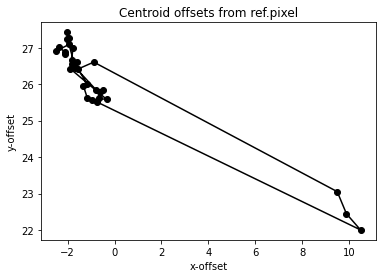

In [519]:
plt.plot(xdeltas, ydeltas, '-ok')
plt.title('Centroid offsets from ref.pixel')
plt.xlabel('x-offset')
plt.ylabel('y-offset')
# plt.savefig('/Users/waritwij/Documents/GitHub/astro_jitter/fig1.png')

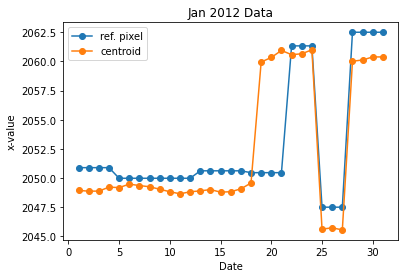

In [520]:
dates = np.arange(31) + 1
plt.plot(dates, xrefs,'-o', label = 'ref. pixel')
plt.plot(dates, xcens,'-o', label = 'centroid')
plt.legend()
plt.xlabel('Date')
plt.ylabel('x-value')
plt.title("Jan 2012 Data")
# plt.savefig('/Users/waritwij/Documents/GitHub/astro_jitter/fig2.png')

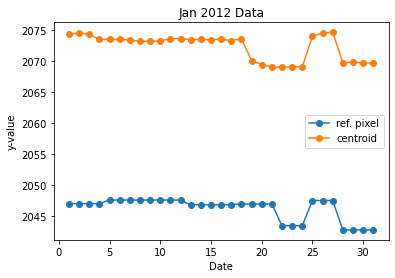

In [521]:
plt.plot(dates, yrefs,'-o', label = 'ref. pixel')
plt.plot(dates, ycens,'-o', label = 'centroid')
plt.legend()
plt.xlabel('Date')
plt.ylabel('y-value')
plt.title("Jan 2012 Data")
# plt.savefig('/Users/waritwij/Documents/GitHub/astro_jitter/fig3.png')

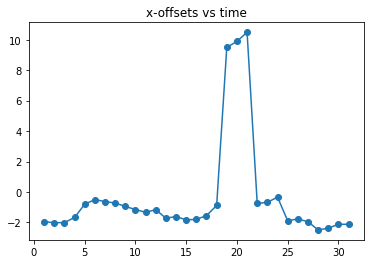

In [524]:
plt.plot(dates, xdeltas,'-o', label = 'ref. pixel')
plt.title('x-offsets vs time')
# plt.savefig('/Users/waritwij/Documents/GitHub/astro_jitter/fig4.png')

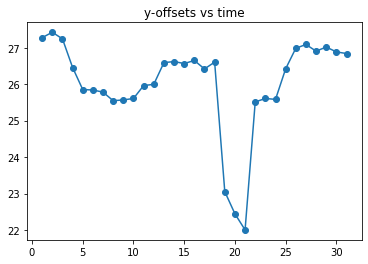

In [525]:
plt.plot(dates, ydeltas,'-o', label = 'ref. pixel')
plt.title("y-offsets vs time")
# plt.savefig('/Users/waritwij/Documents/GitHub/astro_jitter/fig5.png')